## Setup


In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
#!conda activate gnngeometry

In [3]:
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from functools import wraps

# Helper function for visualization.
%matplotlib inline
import matplotlib.pyplot as plt

## Generate Closed Helix

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import torch
from sklearn.neighbors import kneighbors_graph
import scipy as sc
import sklearn as sk
from sklearn.preprocessing import StandardScaler
import torch
from torch_geometric.data import Data
from torch_geometric.utils import from_scipy_sparse_matrix, to_undirected

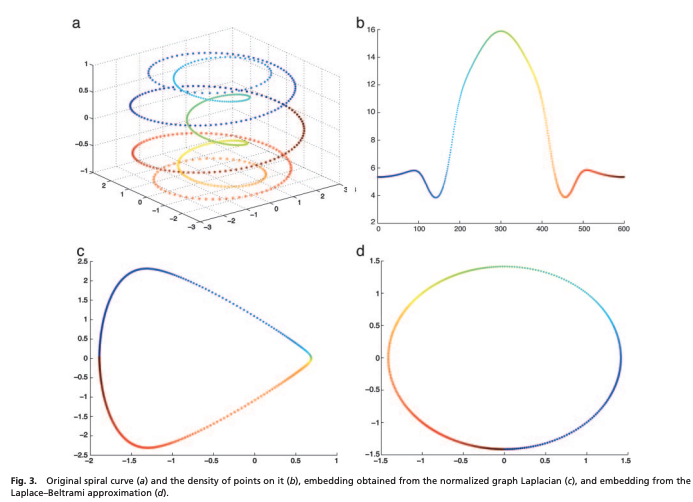

In [5]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [6]:
from simulation_utils.helix import *

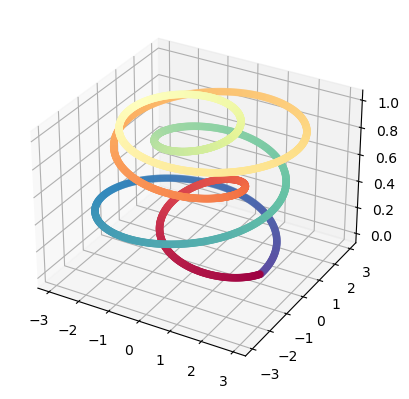

In [7]:
x,y,z,t, A,new_data = get_vhelix(uniform = True)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

In [8]:
from models.dgi import *
from models.train_models import train_dgi
from models.baseline_models import *

In [9]:
cd /Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook

/Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook


## Embeddings across $\alpha$

In [10]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [11]:
from diffusion_maps import *

In [12]:
x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 1, b = 1, n_samples = 1500)

In [13]:
X = np.zeros((1500, 3))
X[:,0] = x
X[:,1] = y
X[:,2] = z

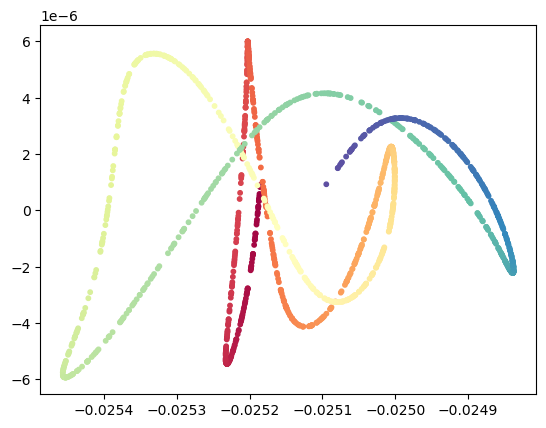

In [14]:
diff_embeddings = apply_diffusions(X, alpha = 1.0, n_eign = 2, n_diff = 10, epsilon = 10)
plt.scatter(*diff_embeddings.T, s = 10, c=t, cmap='Spectral')

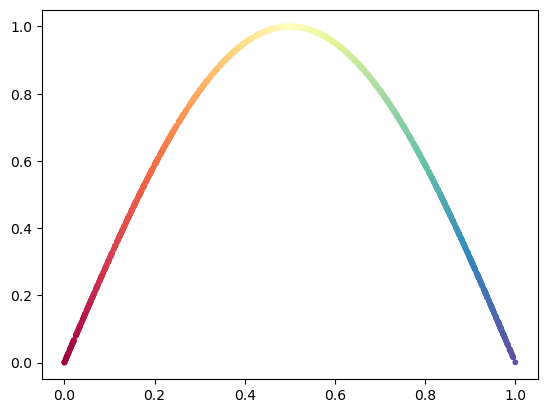

In [15]:
plt.scatter(t,z, s = 10, c=t, cmap='Spectral') # perfect embedding
perfect_embedding = np.zeros((1500,2))
perfect_embedding[:,0] = t
perfect_embedding[:,1] = z

In [16]:
from metrics import *
neighbor_kept_ratio_eval(dataset, diff_embeddings, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, diff_embeddings)
corr

tensor(0.8653)

0.27920521672554693

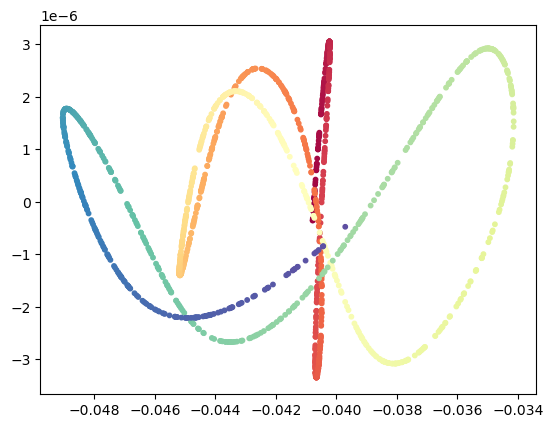

In [17]:
diff_embeddings = apply_diffusions(X, alpha = 0.0, n_eign = 2, n_diff = 10, epsilon = 10)
plt.scatter(*diff_embeddings.T, s = 10, c=t, cmap='Spectral')

In [18]:
neighbor_kept_ratio_eval(dataset, diff_embeddings, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, diff_embeddings)
corr

tensor(0.6631)

0.23948042773131906

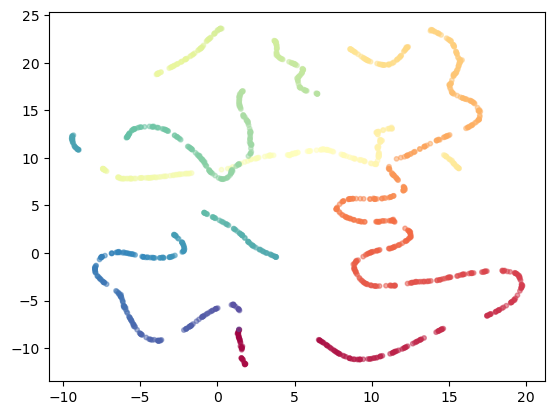

In [19]:
# import umap.umap_ as umap
import umap
umap_embedding = umap.UMAP(n_components=2, n_neighbors= 10, min_dist= 0.3).fit_transform(X)
plt.scatter(*umap_embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

In [20]:
neighbor_kept_ratio_eval(dataset, umap_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, umap_embedding)
corr

tensor(0.9894)

0.7267819871544714

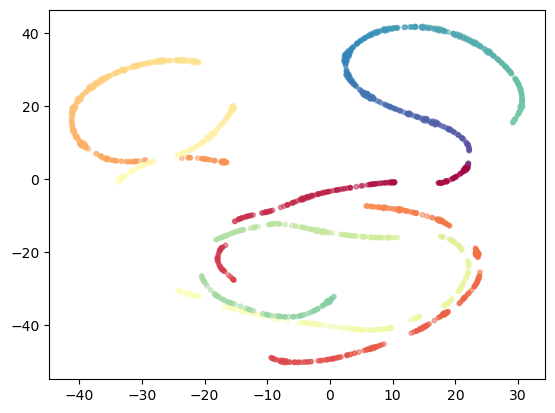

In [21]:
from sklearn.manifold import TSNE
tsne_embedding = TSNE(n_components = 2, learning_rate  = 'auto', init = 'random').fit_transform(X)
plt.scatter(*tsne_embedding.T, s = 10, c=t, alpha=0.5, cmap='Spectral')

In [22]:
neighbor_kept_ratio_eval(dataset, tsne_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, tsne_embedding)
corr

tensor(0.9824)

0.21900574190370226

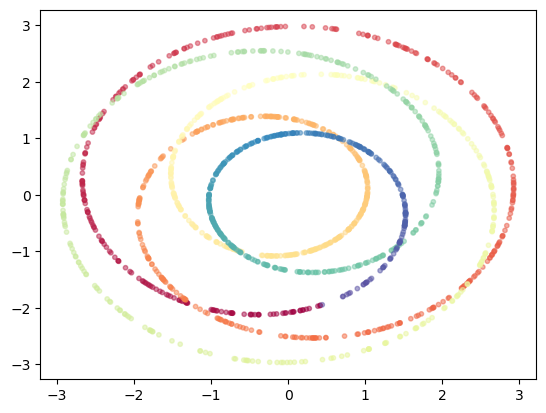

In [23]:
from sklearn.decomposition import PCA
pca_embedding = PCA(n_components = 2).fit_transform(X)
plt.scatter(*pca_embedding.T, s = 10, c=t, alpha=0.5, cmap='Spectral')

In [24]:
neighbor_kept_ratio_eval(dataset, pca_embedding, n_neighbors=10)
_,_,corr,_ = spearman_correlation_eval(perfect_embedding, pca_embedding)
corr

tensor(0.9613)

0.057770813055913306

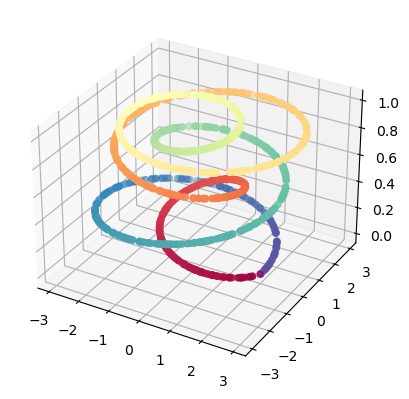

In [25]:
fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

In [26]:
from scipy.special import beta, gamma
from numpy import linspace, exp
def beta_density_plot(a=1, b =1, n_samples = 500):
    x = linspace(.01, .99, n_samples)
    a = a
    b = b
    y = (1 / beta(a, b)) * x ** (a - 1) * (1 - x) ** (b - 1)
    # plt.figure(figsize = (12,8))
    plt.scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
    plt.show()

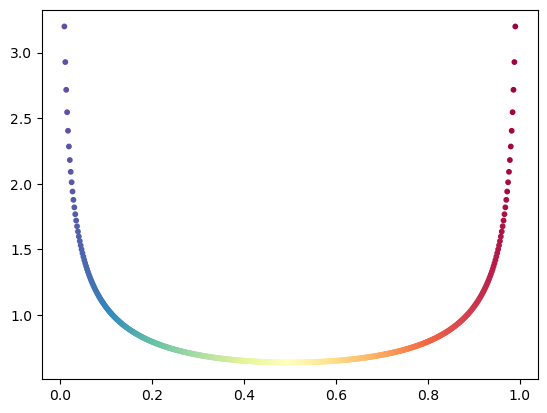

In [27]:
beta_density_plot(a=0.5, b = 0.5)

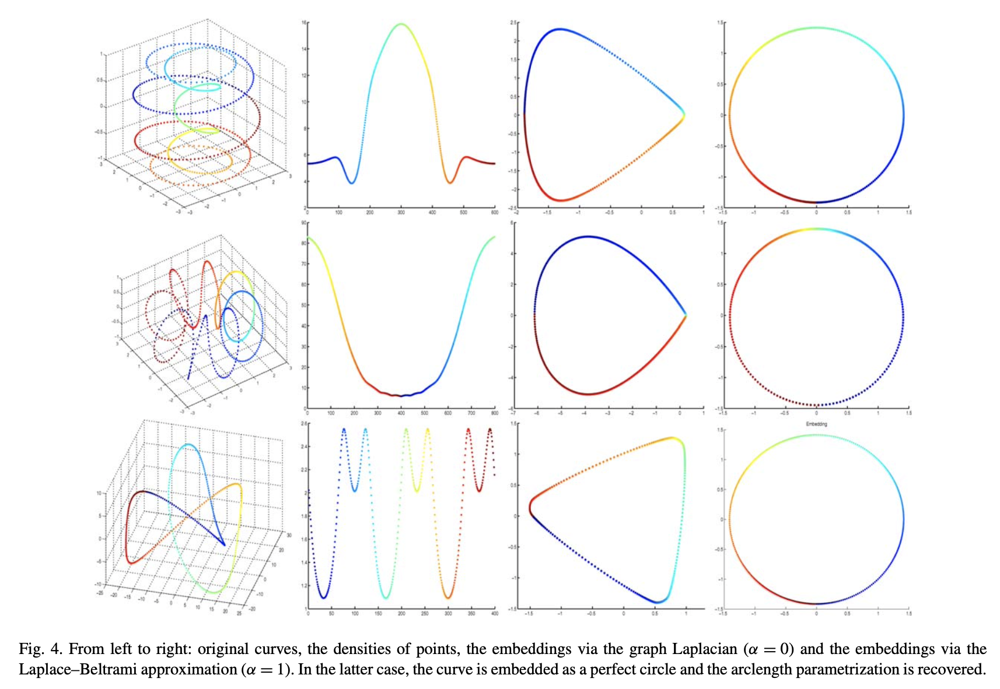

In [30]:
cd /Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook

/Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook


In [31]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=0.6833, time=0.0143
Epoch=001, loss=0.5785, time=0.0135
Epoch=002, loss=0.6149, time=0.0159
Epoch=003, loss=0.6099, time=0.0475
Epoch=004, loss=0.5973, time=0.0116
Epoch=005, loss=0.5757, time=0.0119
Epoch=006, loss=0.5909, time=0.0119
Epoch=007, loss=0.5624, time=0.0099
Epoch=008, loss=0.5637, time=0.0094
Epoch=009, loss=0.5580, time=0.0114
Epoch=010, loss=0.5440, time=0.0095
Epoch=011, loss=0.5442, time=0.0100
Epoch=012, loss=0.5514, time=0.0101
Epoch=013, loss=0.5708, time=0.0114
Epoch=014, loss=0.5455, time=0.0123
Epoch=015, loss=0.5439, time=0.0123
Epoch=016, loss=0.5486, time=0.0132
Epoch=017, loss=0.5453, time=0.0118
Epoch=018, loss=0.5301, time=0.0108
Epoch=019, loss=0.5341, time=0.0112
Epoch=020, loss=0.5174, time=0.0104
Epoch=021, loss=0.5364, time=0.0097
Epoch=022, loss=0.5393, time=0.0113
Epoch=023, loss=0.5111, time=0.0098
Epoch=024, loss=0.5079, time=0.0100
Epoch=025, loss=0.5360, time=0.0092
Epoch=026, loss=0.5170, time=0.0102
Epoc

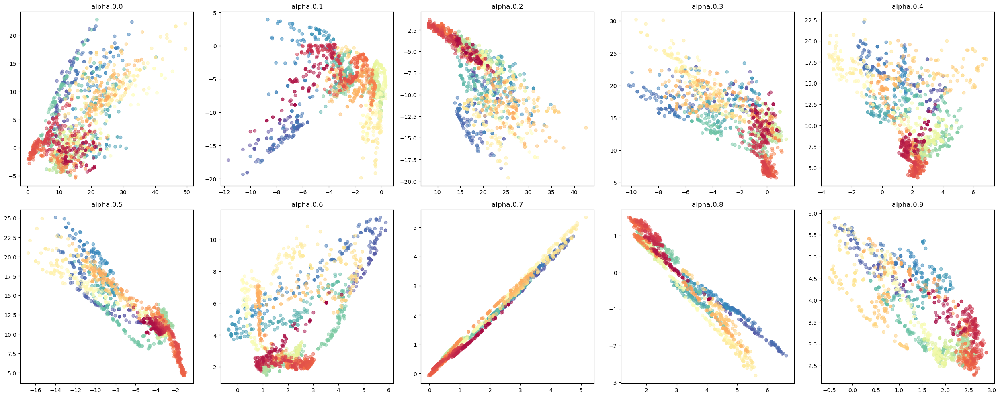

In [33]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.198850,0.233738,0.199337,0.204059,0.220149,0.219294,0.252717,0.206408,0.229628,0.261901,3
1,0.282216,0.363022,0.270814,0.280157,0.312267,0.315741,0.407293,0.287905,0.389304,0.505858,10
2,0.376281,0.453455,0.312055,0.332216,0.367358,0.384950,0.535974,0.359033,0.529309,0.667994,20
3,0.516863,0.599646,0.388574,0.418312,0.502591,0.510216,0.769049,0.516841,0.743042,0.865466,50
4,0.671226,0.779206,0.493307,0.541232,0.687853,0.627364,0.905889,0.710474,0.880442,0.952808,100


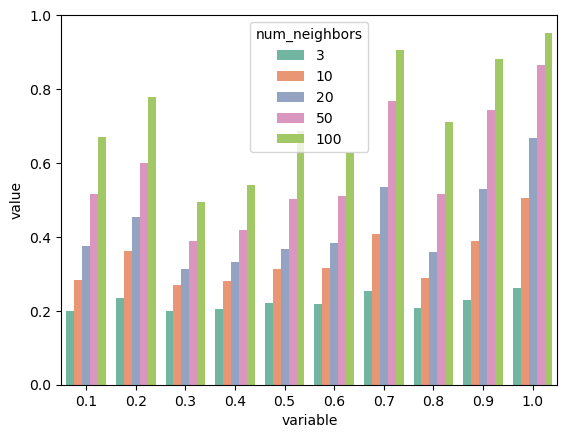

In [34]:
from metrics import *
knn_eval_plot(dataset,out)

,alpha,spearman,kendall_tau
0,0.1,0.115389,0.076508
1,0.2,0.448823,0.305680
2,0.3,0.148185,0.098031
3,0.4,0.154015,0.104160
4,0.5,0.185943,0.124977
5,0.6,0.136336,0.092981
6,0.7,0.244012,0.165350
7,0.8,0.179686,0.121920
8,0.9,0.219759,0.148893
9,1.0,0.216113,0.145542


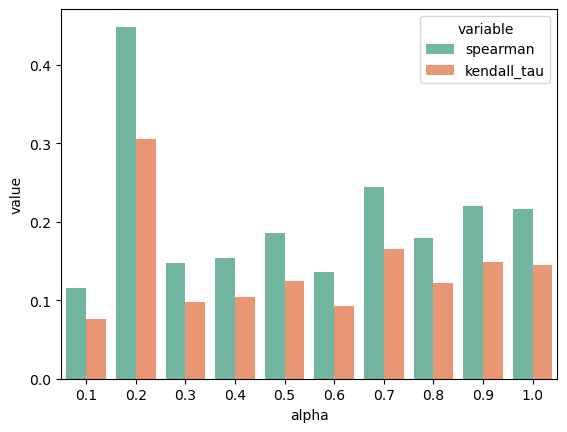

In [35]:
corr_eval_plot(perfect_embedding, out)

In [36]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, gnn_type = 'RW', 
              alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=0.6889, time=0.0215
Epoch=001, loss=0.6823, time=0.0155
Epoch=002, loss=0.6749, time=0.0151
Epoch=003, loss=0.6670, time=0.0197
Epoch=004, loss=0.6582, time=0.0130
Epoch=005, loss=0.6500, time=0.0112
Epoch=006, loss=0.6416, time=0.0113
Epoch=007, loss=0.6312, time=0.0108
Epoch=008, loss=0.6211, time=0.0116
Epoch=009, loss=0.6131, time=0.0105
Epoch=010, loss=0.6023, time=0.0102
Epoch=011, loss=0.5973, time=0.0102
Epoch=012, loss=0.5869, time=0.0108
Epoch=013, loss=0.5747, time=0.0102
Epoch=014, loss=0.5660, time=0.0125
Epoch=015, loss=0.5517, time=0.0121
Epoch=016, loss=0.5418, time=0.0119
Epoch=017, loss=0.5336, time=0.0110
Epoch=018, loss=0.5286, time=0.0106
Epoch=019, loss=0.5124, time=0.0111
Epoch=020, loss=0.4997, time=0.0112
Epoch=021, loss=0.4828, time=0.0090
Epoch=022, loss=0.4790, time=0.0110
Epoch=023, loss=0.4786, time=0.0108
Epoch=024, loss=0.4563, time=0.0094
Epoch=025, loss=0.4438, time=0.0110
Epoch=026, loss=0.4358, time=0.0104
Epoc

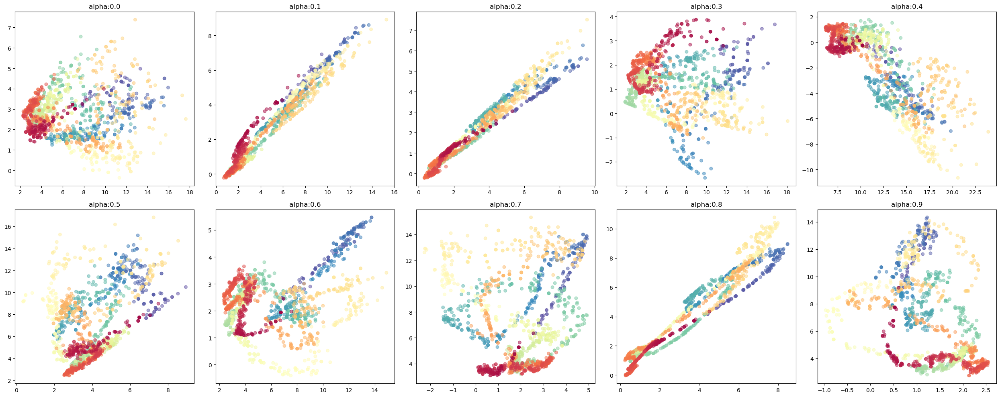

In [37]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.199400,0.189124,0.195502,0.237305,0.201081,0.210735,0.225647,0.252930,0.272644,0.261126,3
1,0.282063,0.259697,0.268952,0.328903,0.293311,0.317325,0.356816,0.433829,0.475214,0.477246,10
2,0.335719,0.312962,0.322299,0.390216,0.351838,0.405625,0.479073,0.591698,0.628238,0.633810,20
3,0.409366,0.409748,0.409239,0.535340,0.466860,0.572772,0.702102,0.814202,0.817343,0.834728,50
4,0.511273,0.531597,0.527878,0.720990,0.644921,0.753296,0.855099,0.932452,0.931716,0.953166,100


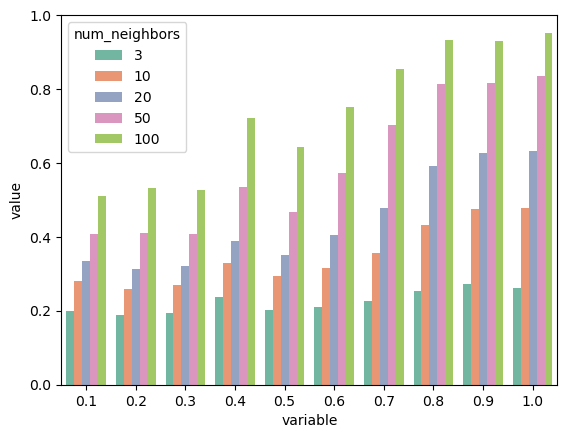

In [38]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.221182,0.149307
1,0.2,0.213014,0.143224
2,0.3,0.226259,0.154857
3,0.4,0.265754,0.179733
4,0.5,0.198725,0.131954
5,0.6,0.229611,0.154230
6,0.7,0.239183,0.162921
7,0.8,0.236031,0.160050
8,0.9,0.187995,0.126741
9,1.0,0.249473,0.171160


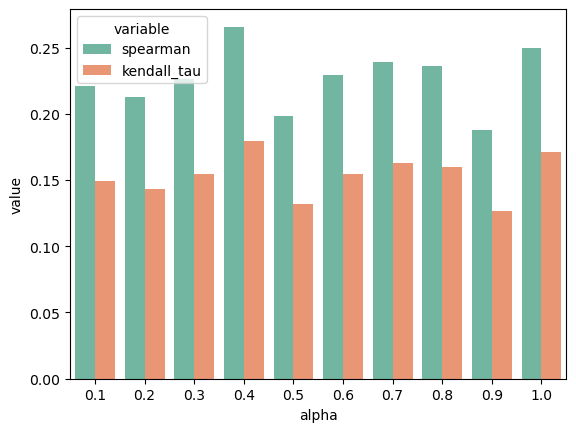

In [39]:
corr_eval_plot(perfect_embedding, out)

In [40]:
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *

In [41]:
out = {}
alpha = np.arange(0.1,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="symmetric", alpha=alpha[i], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp


=== train GRACE model ===
Epoch=000, loss=7.4627
Epoch=001, loss=7.3447
Epoch=002, loss=8.5123
Epoch=003, loss=7.3503
Epoch=004, loss=7.3281
Epoch=005, loss=7.3406
Epoch=006, loss=7.3269
Epoch=007, loss=7.3341
Epoch=008, loss=7.2993
Epoch=009, loss=8.4778
Epoch=010, loss=7.3083
Epoch=011, loss=8.3941
Epoch=012, loss=7.2617
Epoch=013, loss=7.2510
Epoch=014, loss=8.4453
Epoch=015, loss=7.2487
Epoch=016, loss=7.2373
Epoch=017, loss=7.2952
Epoch=018, loss=7.2083
Epoch=019, loss=7.2719
Epoch=020, loss=7.2968
Epoch=021, loss=7.6452
Epoch=022, loss=8.5443
Epoch=023, loss=7.0505
Epoch=024, loss=7.2428
Epoch=025, loss=7.8506
Epoch=026, loss=8.1330
Epoch=027, loss=8.3879
Epoch=028, loss=8.3559
Epoch=029, loss=7.5616
Epoch=030, loss=6.9391
Epoch=031, loss=7.4160
Epoch=032, loss=8.1626
Epoch=033, loss=7.6960
Epoch=034, loss=7.0264
Epoch=035, loss=7.0252
Epoch=036, loss=7.5306
Epoch=037, loss=8.2048
Epoch=038, loss=7.0056
Epoch=039, loss=6.9784
Epoch=040, loss=7.7692
Epoch=041, loss=7.8334
Epoch=04

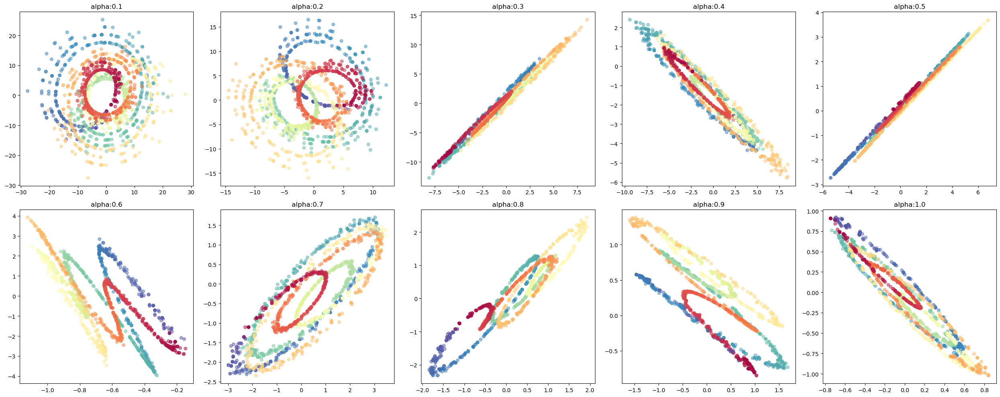

In [42]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [43]:
grace_symm_out = out

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.336982,0.356356,0.261158,0.296061,0.239027,0.283991,0.389851,0.369567,0.386356,0.415879,3
1,0.583894,0.620613,0.429533,0.487035,0.392445,0.493128,0.736670,0.685197,0.739141,0.785252,10
2,0.757161,0.783548,0.522124,0.604041,0.521561,0.635921,0.890912,0.835457,0.892309,0.901994,20
3,0.928123,0.943425,0.669970,0.779614,0.727233,0.844315,0.985924,0.958990,0.986253,0.977511,50
4,0.988989,0.993831,0.838555,0.899338,0.896637,0.960626,0.998948,0.992463,0.999889,0.997177,100


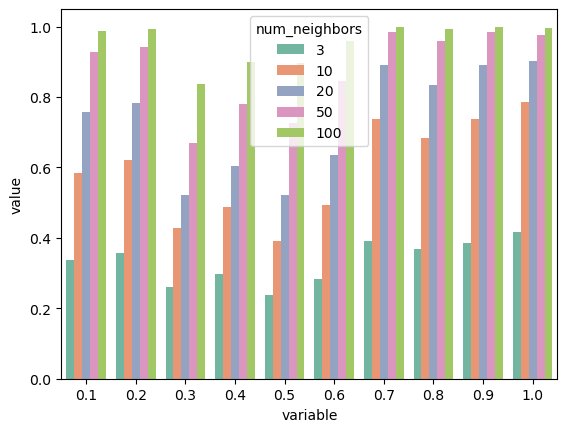

In [44]:
knn_eval_plot(dataset, out)

In [46]:
# global geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
corr = torch.zeros((10,2))
for j in range(2):
    for i in range(10):       
        _,_,corr[i,j],_ = spearman_correlation_eval(perfect_embeddings,results['roll_' + exp[j] + '_' + str(alpha[i+1])+ '_loop_True_' + str(0)]['embedding'].detach().numpy())

corr = pd.DataFrame(corr)
corr.columns = exp
corr

NameError: name 'perfect_embeddings' is not defined

In [45]:
# local geometry
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
res = torch.zeros((10,2))
for j in range(2):
    for i in range(10):       
        res[i,j] = neighbor_kept_ratio_eval(data,results['roll_' + exp[j] + '_' + str(alpha[i+1])+ '_loop_True_' + str(0)]['embedding'].detach().numpy(), n_neighbors = 5)

df = pd.DataFrame(res)
df.columns = exp
df

NameError: name 'data' is not defined

In [ ]:
alpha = np.arange(0,1.1,0.1)
exp = ['normal','diffusion']
dens = torch.zeros((10,2))
for j in range(2):
    for i in range(10):       
        Y = results['roll_' + exp[j] + '_' + str(alpha[i+1])+ '_loop_True_' + str(0)]['embedding'].detach().numpy()
        dens[i,j] = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)

dens = pd.DataFrame(corr)
dens.columns = exp
dens

,alpha,spearman,kendall_tau
0,0.1,0.421777,0.297138
1,0.2,0.124476,0.084084
2,0.3,0.221367,0.150938
3,0.4,0.347856,0.241076
4,0.5,0.106935,0.071748
5,0.6,0.167289,0.113778
6,0.7,0.660137,0.487708
7,0.8,0.219459,0.149933
8,0.9,0.123925,0.083905
9,1.0,0.322778,0.223540


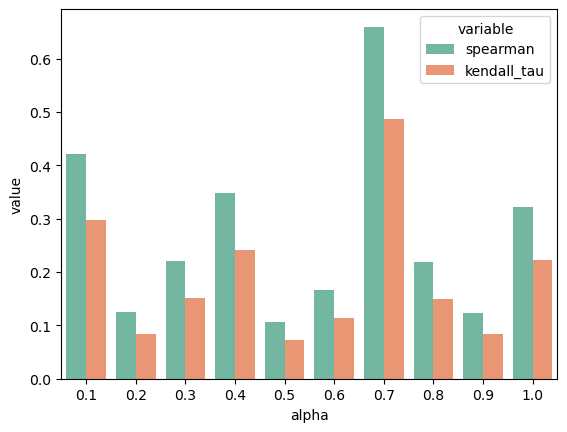

In [ ]:
corr_eval_plot(perfect_embedding, out)

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="RW", alpha=alpha[i], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train GRACE model ===
Epoch=000, loss=7.7111
Epoch=001, loss=7.3008
Epoch=002, loss=7.3358
Epoch=003, loss=8.3491
Epoch=004, loss=7.2600
Epoch=005, loss=8.1425
Epoch=006, loss=7.7687
Epoch=007, loss=7.5143
Epoch=008, loss=7.9436
Epoch=009, loss=7.3537
Epoch=010, loss=7.6666
Epoch=011, loss=7.4694
Epoch=012, loss=7.4613
Epoch=013, loss=7.3835
Epoch=014, loss=7.3781
Epoch=015, loss=7.3571
Epoch=016, loss=8.2328
Epoch=017, loss=7.9598
Epoch=018, loss=7.6291
Epoch=019, loss=7.9494
Epoch=020, loss=7.3343
Epoch=021, loss=7.6558
Epoch=022, loss=7.9311
Epoch=023, loss=7.3399
Epoch=024, loss=7.3880
Epoch=025, loss=7.3780
Epoch=026, loss=7.3249
Epoch=027, loss=7.3219
Epoch=028, loss=7.3099
Epoch=029, loss=7.3046
Epoch=030, loss=7.3485
Epoch=031, loss=7.9679
Epoch=032, loss=7.9876
Epoch=033, loss=7.2817
Epoch=034, loss=7.8870
Epoch=035, loss=7.8763
Epoch=036, loss=7.7521
Epoch=037, loss=7.2600
Epoch=038, loss=7.4179
Epoch=039, loss=7.2847
Epoch=040, loss=7.5232
Epoch=041, loss=7.2695
Epoch=04

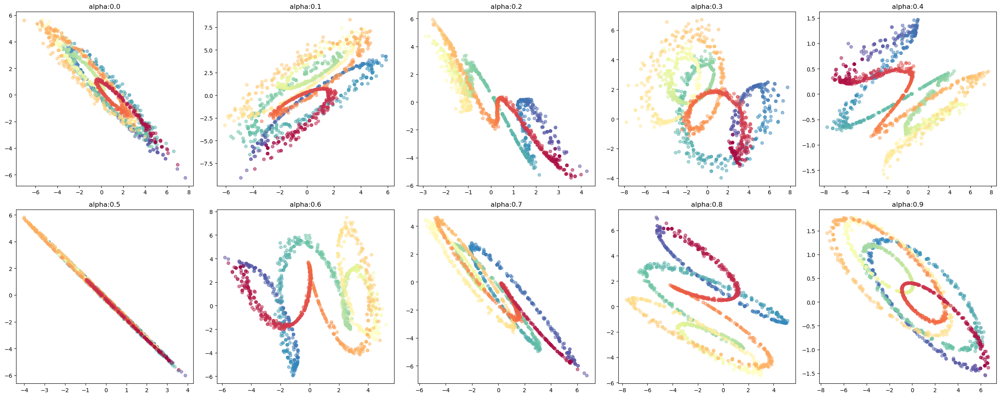

In [ ]:
# row-normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.283739,0.320929,0.278707,0.328219,0.286800,0.214359,0.340841,0.347403,0.388175,0.394049,3
1,0.468292,0.519688,0.457006,0.577963,0.507468,0.328665,0.636592,0.637798,0.734687,0.748864,10
2,0.581931,0.649866,0.590088,0.735392,0.643494,0.417507,0.808632,0.792437,0.889919,0.888721,20
3,0.731867,0.853279,0.778413,0.914370,0.842781,0.601400,0.969724,0.946872,0.990606,0.980266,50
4,0.860361,0.950413,0.902991,0.981033,0.940162,0.836142,0.997895,0.993610,0.999428,0.998438,100


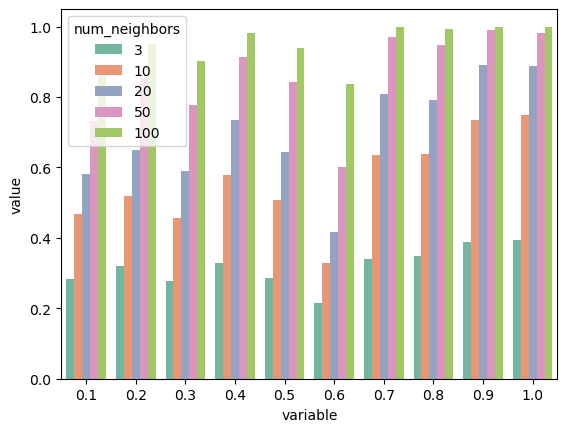

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.182967,0.124472
1,0.2,0.237776,0.162816
2,0.3,0.509004,0.358598
3,0.4,0.496621,0.348501
4,0.5,0.311881,0.212721
5,0.6,0.105383,0.071231
6,0.7,0.475970,0.338436
7,0.8,0.324757,0.224014
8,0.9,0.369453,0.259350
9,1.0,0.184263,0.125577


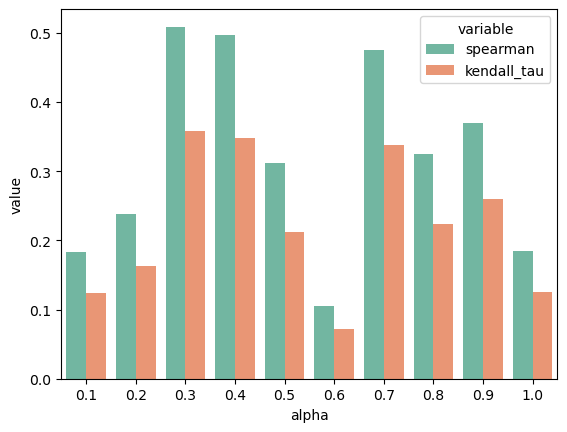

In [ ]:
corr_eval_plot(perfect_embedding, out)

### cca-ssg

In [ ]:
from models.cca_ssg import *
from models.train_models import train_cca_ssg
from models.baseline_models import *

In [ ]:
out = {}
alpha = np.arange(0.1,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'symmetric',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


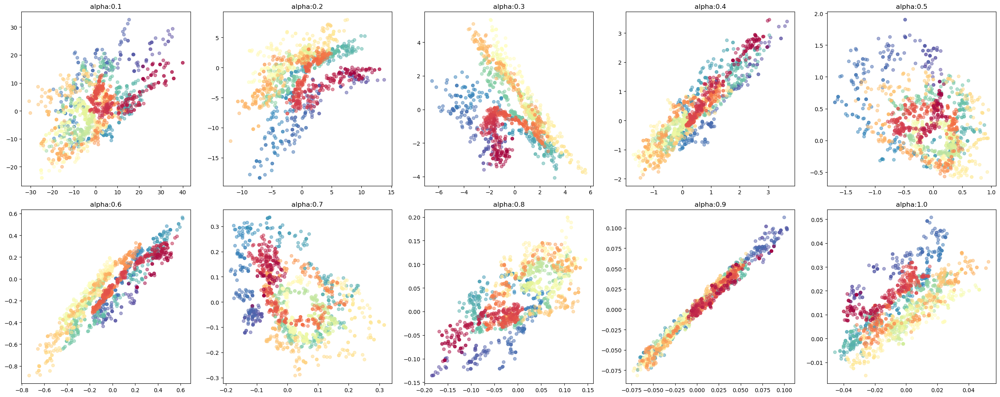

In [ ]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.223988,0.221817,0.240901,0.226117,0.269214,0.249130,0.282867,0.273253,0.190798,0.231907,3
1,0.426455,0.413782,0.439921,0.422565,0.531796,0.445885,0.571958,0.517669,0.321999,0.438840,10
2,0.592081,0.579419,0.603684,0.571539,0.716013,0.604279,0.760585,0.687214,0.460465,0.596686,20
3,0.826300,0.807085,0.815051,0.779739,0.911662,0.822217,0.931285,0.894575,0.667731,0.804794,50
4,0.937791,0.928919,0.937423,0.916645,0.984379,0.935885,0.983680,0.973148,0.826259,0.924551,100


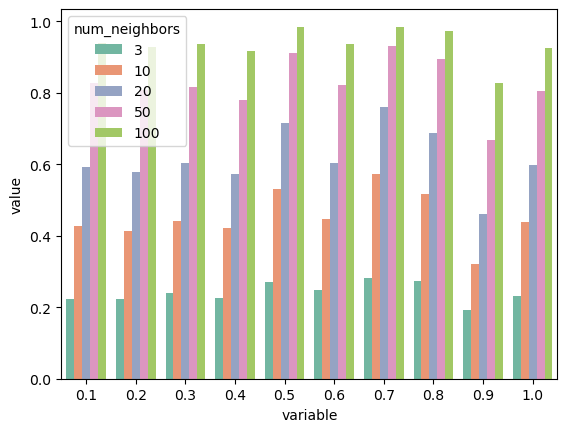

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.335809,0.231355
1,0.2,0.347738,0.238165
2,0.3,0.290888,0.201623
3,0.4,0.330048,0.226979
4,0.5,0.255037,0.174829
5,0.6,0.254200,0.171156
6,0.7,0.298621,0.200457
7,0.8,0.422541,0.295559
8,0.9,0.248463,0.168986
9,1.0,0.188096,0.127196


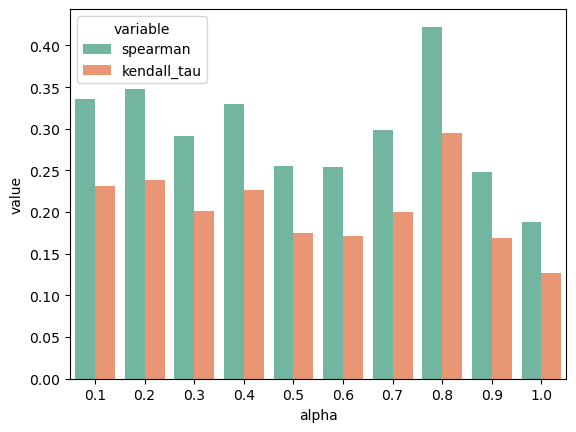

In [ ]:
corr_eval_plot(perfect_embedding, out)

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'RW',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


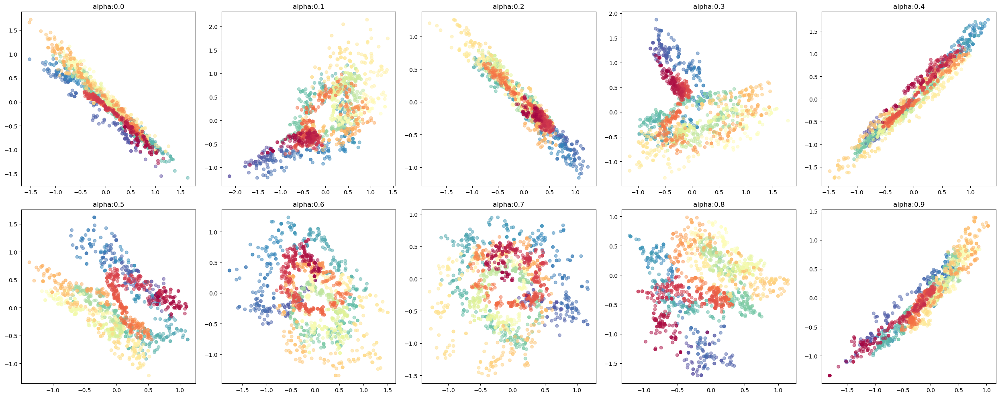

In [ ]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.197910,0.213410,0.189081,0.232704,0.221853,0.247723,0.291362,0.274147,0.269716,0.225585,3
1,0.322917,0.382180,0.306505,0.431573,0.392228,0.484980,0.584026,0.540977,0.533886,0.418228,10
2,0.435963,0.537828,0.424897,0.591915,0.517827,0.663742,0.781763,0.749902,0.712132,0.568684,20
3,0.630277,0.762714,0.621827,0.809541,0.699757,0.871412,0.943272,0.930065,0.910705,0.789805,50
4,0.790818,0.899960,0.782374,0.933444,0.846465,0.970125,0.992016,0.986134,0.978484,0.920839,100


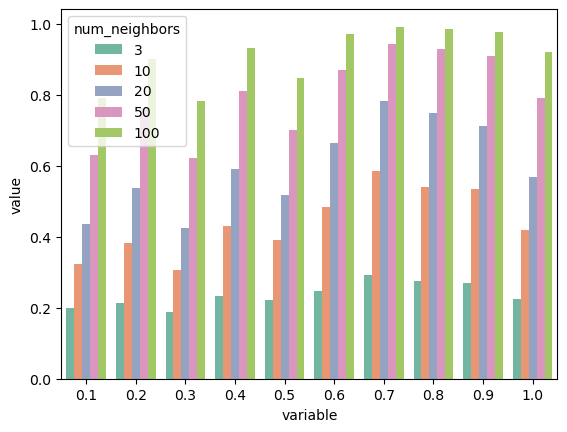

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.111778,0.074960
1,0.2,0.374083,0.258319
2,0.3,0.188727,0.128227
3,0.4,0.377502,0.262184
4,0.5,0.098755,0.065630
5,0.6,0.370491,0.256192
6,0.7,0.216014,0.147378
7,0.8,0.145981,0.099203
8,0.9,0.555022,0.396391
9,1.0,0.268088,0.182915


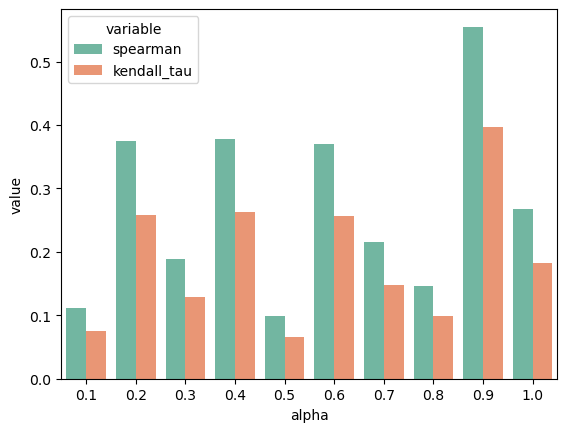

In [ ]:
corr_eval_plot(perfect_embedding, out)

### BGRL

In [ ]:
from models.bgrl import *
from models.train_models import train_bgrl
from models.baseline_models import *

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'symmetric',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=2.3527
Epoch=001, loss=2.5039
Epoch=002, loss=2.6217
Epoch=003, loss=2.2804
Epoch=004, loss=4.7933
Epoch=005, loss=2.4658
Epoch=006, loss=2.3580
Epoch=007, loss=2.3538
Epoch=008, loss=2.3281
Epoch=009, loss=2.4291
Epoch=010, loss=2.5355
Epoch=011, loss=2.3642
Epoch=012, loss=2.4197
Epoch=013, loss=2.3015
Epoch=014, loss=2.1966
Epoch=015, loss=2.5661
Epoch=016, loss=2.5619
Epoch=017, loss=2.3301
Epoch=018, loss=2.2740
Epoch=019, loss=2.2930
Epoch=020, loss=2.5179
Epoch=021, loss=2.1857
Epoch=022, loss=2.2487
Epoch=023, loss=2.2017
Epoch=024, loss=2.2042
Epoch=025, loss=2.6524
Epoch=026, loss=4.6639
Epoch=027, loss=2.2594
Epoch=028, loss=2.1774
Epoch=029, loss=2.1662
Epoch=030, loss=2.3890
Epoch=031, loss=2.0911
Epoch=032, loss=2.2066
Epoch=033, loss=2.0622
Epoch=034, loss=2.0745
Epoch=035, loss=2.1435
Epoch=036, loss=2.1229
Epoch=037, loss=2.2745
Epoch=038, loss=1.9488
Epoch=039, loss=2.1178
Epoch=040, loss=2.0025
Epoch=041, loss=2.2280
Epoch=042

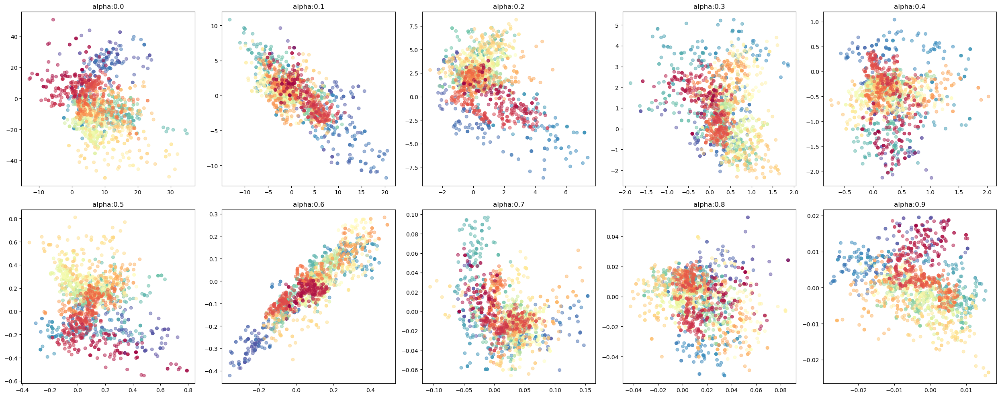

In [ ]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.181204,0.172081,0.186224,0.184881,0.192772,0.186018,0.183827,0.180670,0.182502,0.198161,3
1,0.283158,0.261698,0.295974,0.293941,0.328394,0.299807,0.314055,0.292085,0.301710,0.354247,10
2,0.381907,0.362248,0.392994,0.407716,0.451070,0.419752,0.433845,0.391055,0.425153,0.486216,20
3,0.585145,0.553064,0.574248,0.607770,0.635873,0.647100,0.649915,0.594102,0.635011,0.693317,50
4,0.756419,0.714761,0.712574,0.776542,0.790323,0.807107,0.827093,0.745938,0.787711,0.835209,100


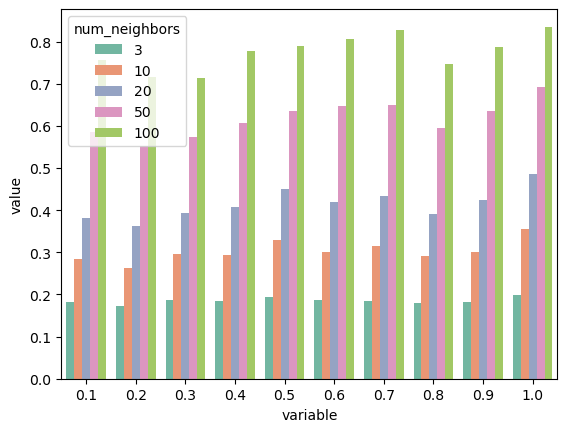

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.452261,0.311965
1,0.2,0.273367,0.186974
2,0.3,0.318186,0.213734
3,0.4,0.059563,0.039380
4,0.5,0.246376,0.165883
5,0.6,0.463586,0.320517
6,0.7,0.211203,0.144481
7,0.8,0.197453,0.133308
8,0.9,0.086029,0.057567
9,1.0,0.303758,0.206209


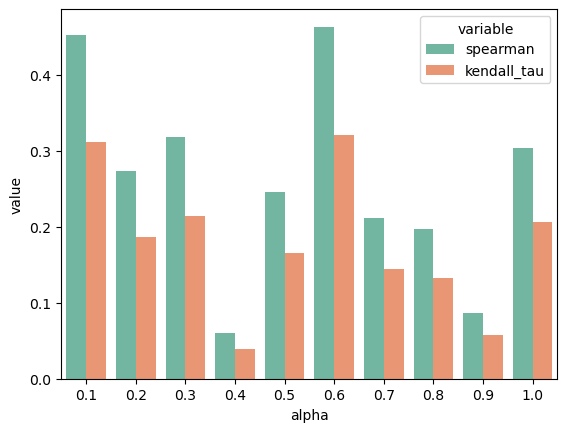

In [ ]:
corr_eval_plot(perfect_embedding, out)

In [ ]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'RW',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=4.8661
Epoch=001, loss=4.0533
Epoch=002, loss=4.2823
Epoch=003, loss=4.1097
Epoch=004, loss=4.0657
Epoch=005, loss=3.9488
Epoch=006, loss=3.9367
Epoch=007, loss=3.8345
Epoch=008, loss=4.1457
Epoch=009, loss=4.2226
Epoch=010, loss=4.2285
Epoch=011, loss=4.2004
Epoch=012, loss=4.2814
Epoch=013, loss=4.4419
Epoch=014, loss=4.1345
Epoch=015, loss=4.0721
Epoch=016, loss=4.1390
Epoch=017, loss=4.0820
Epoch=018, loss=4.0977
Epoch=019, loss=4.2378
Epoch=020, loss=4.1993
Epoch=021, loss=4.0198
Epoch=022, loss=4.0114
Epoch=023, loss=4.1191
Epoch=024, loss=4.0122
Epoch=025, loss=4.1249
Epoch=026, loss=4.1693
Epoch=027, loss=3.7929
Epoch=028, loss=4.0613
Epoch=029, loss=4.2343
Epoch=030, loss=3.5920
Epoch=031, loss=4.0290
Epoch=032, loss=3.7104
Epoch=033, loss=3.7906
Epoch=034, loss=3.8702
Epoch=035, loss=4.0875
Epoch=036, loss=4.0442
Epoch=037, loss=4.2897
Epoch=038, loss=4.0250
Epoch=039, loss=3.8142
Epoch=040, loss=3.8723
Epoch=041, loss=3.8241
Epoch=042

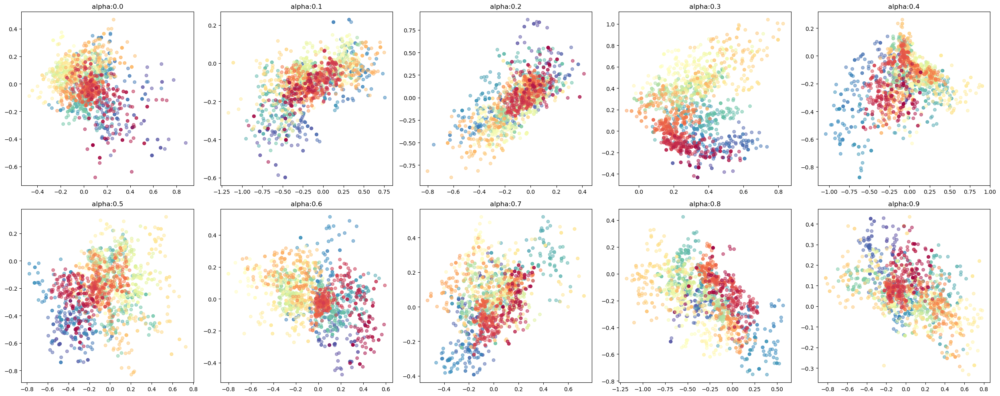

In [ ]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.168419,0.180379,0.177871,0.173907,0.198989,0.183166,0.190292,0.182190,0.207468,0.189896,3
1,0.258868,0.289862,0.293068,0.274422,0.344513,0.308162,0.337393,0.305632,0.370621,0.316376,10
2,0.352814,0.405600,0.408065,0.390345,0.466645,0.438600,0.471947,0.416500,0.517518,0.442235,20
3,0.548765,0.613499,0.596953,0.593611,0.686922,0.635240,0.674338,0.633532,0.732301,0.642469,50
4,0.732499,0.790879,0.761894,0.778529,0.848456,0.796301,0.814392,0.784643,0.879706,0.783337,100


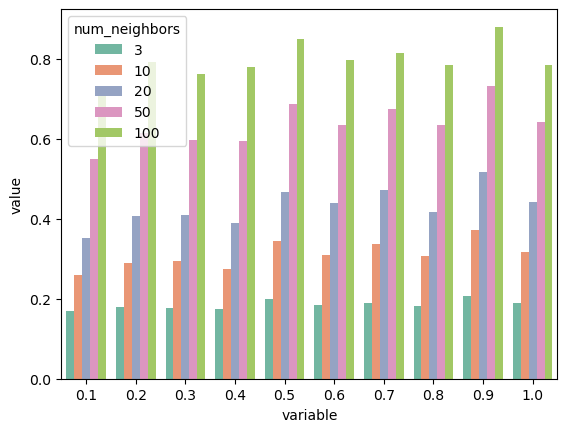

In [ ]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.379606,0.262271
1,0.2,0.078317,0.052367
2,0.3,0.124387,0.083487
3,0.4,0.527326,0.372191
4,0.5,0.173230,0.114656
5,0.6,0.306354,0.206940
6,0.7,0.416422,0.287035
7,0.8,0.145626,0.096873
8,0.9,0.139575,0.093210
9,1.0,0.074215,0.049076


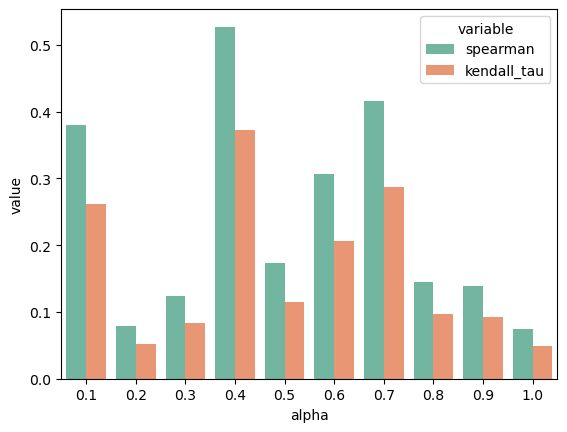

In [ ]:
corr_eval_plot(perfect_embedding, out)